# micro bboxes

In [ ]:
import mxnet as mx
import gluoncv
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

In [2]:
!pwd

/home/ec2-user/SageMaker/test_03_30/EulerEye


Change the root directory to `pwd` shows

In [ ]:
root_dir = "/home/ec2-user/SageMaker/test_03_30/EulerEye"

In [4]:
def read_ocr_coords(root_dir, file_name):
    bboxes = []
    file_path = "{}/output/ocr_coords/{}".format(root_dir, file_name)
    sheet = open(file_path, "r")
    for line in sheet:
        if line:
            try: 
                l = line.split(", ") # Reason is sometimes there is \", "\ in ocr word
                [xmin, ymin, xmax, ymax] = l[-4:]
                bboxes.append([int(xmin), int(ymin), int(xmax), int(ymax)])
            except:
                print(line.split(", "))
    return np.array(bboxes)

In [5]:
def visualization_image_with_box(root_dir, image_file_name, save_img=False):
    
    # 1. Parse file key (design like this because the given image has so many different format)
    file_format = '.' + image_file_name.split("/")[-1].split(".")[-1]
    file_key = image_file_name.split("/")[-1].split(file_format)[0]
    
    img_file_path = "{}/demo_image/{}".format(root_dir, image_file_name)
    ocr_file_path = "{}/output/ocr_coords/{}.txt".format(root_dir, file_key)
    image = mx.image.imread(img_file_path).asnumpy()
    bboxes = read_ocr_coords(root_dir, file_key+".txt")

    plt.figure(figsize=(60, 60))
    ax1 = plt.subplot(1, 2, 1)
    gluoncv.utils.viz.plot_bbox(image, bboxes, ax=ax1)
    
    if save_img:
        plt.savefig("{}/output/visualization/{}.png".format(root_dir, file_key))

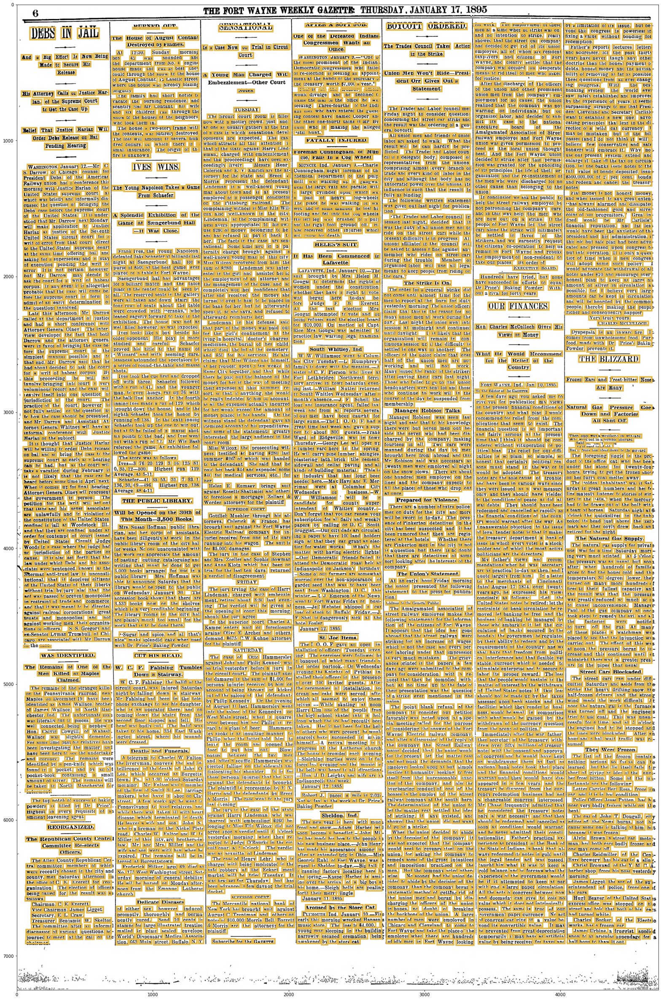

In [7]:
visualization_image_with_box(root_dir, "007759480.png", True)

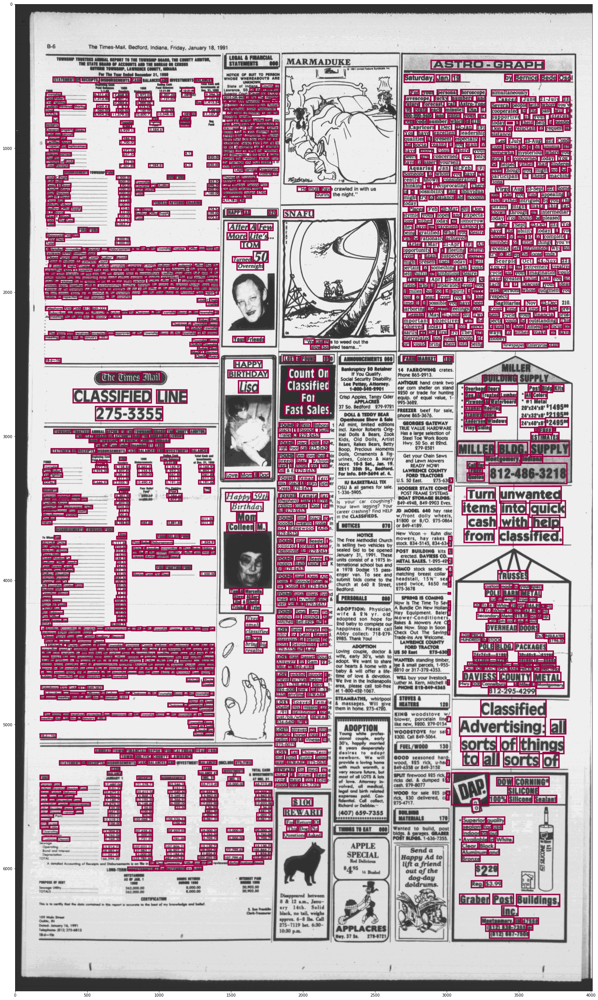

In [9]:
visualization_image_with_box(root_dir, "0053.tif", True)